## Find Difference of Defense Systems Abundance in Different Groups

In [3]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Projects/GENIUS_Repository/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/Projects/GENIUS_Repository


In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Import necessary libraries
import os
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from statsmodels.formula.api import ols
import statsmodels.api as sm

# Define directory paths
directory_path = 'Collect/Origin/Defense_Abundance_Sort_Sample/'
save_path = 'Results/01.Defense_Abundance/'

# Ensure save_path directory exists
os.makedirs(save_path, exist_ok=True)

# Function to load data
def load_data(file_path):
    return pd.read_csv(file_path, sep='\t')

# Function to perform PCA and plot with confidence intervals and statistical significance
def plot_pca(data, group1_cols, group2_cols, title, anova_p_value, mean1, mean2, std1, std2):
    group1 = data.iloc[:, group1_cols]
    group2 = data.iloc[:, group2_cols]
    combined_data = pd.concat([group1, group2], axis=1)

    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(combined_data.T)

    explained_var = pca.explained_variance_ratio_ * 100

    pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])
    pca_df['Group'] = ['Before Filter'] * group1.shape[1] + ['After Filter'] * group2.shape[1]

    plt.figure(figsize=(12, 10))
    sns.set(style="whitegrid")

    # Plot PCA points
    sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='Group', palette=['#F53255', '#00CBBF'], s=100, edgecolor='w', alpha=0.7)

    # Calculate and plot confidence ellipses
    for group, color in zip(['Before Filter', 'After Filter'], ['#F53255', '#00CBBF']):
        subset = pca_df[pca_df['Group'] == group]
        mean = np.mean(subset[['PC1', 'PC2']], axis=0)
        cov = np.cov(subset[['PC1', 'PC2']], rowvar=False)
        eigenvalues, eigenvectors = np.linalg.eigh(cov)
        order = eigenvalues.argsort()[::-1]
        eigenvalues, eigenvectors = eigenvalues[order], eigenvectors[:, order]

        theta = np.degrees(np.arctan2(*eigenvectors[:, 0][::-1]))
        width, height = 2 * np.sqrt(eigenvalues)

        ellipse = plt.matplotlib.patches.Ellipse(xy=mean, width=width, height=height, angle=theta, color=color, alpha=0.2)
        plt.gca().add_patch(ellipse)

    plt.title(f'PCA of {title}', fontsize=18)
    plt.xlabel(f'Principal Component 1 ({explained_var[0]:.2f}%)', fontsize=14)
    plt.ylabel(f'Principal Component 2 ({explained_var[1]:.2f}%)', fontsize=14)
    plt.legend(title='Group')
    plt.grid(True)

    # Display statistical significance
    plt.figtext(0.15, 0.85, f'ANOVA p-value = {anova_p_value:.2e}', fontsize=12, ha='left', va='center', color='black')

    # Save the PCA plot
    plt.savefig(os.path.join(save_path, f'{title}_PCA.pdf'), format='pdf')
    plt.close()

    # Plot the bar chart with error bars
    plt.figure(figsize=(8, 6))
    plt.bar(['Before Filter', 'After Filter'], [mean1, mean2], yerr=[std1, std2], color=['#F53255', '#00CBBF'], alpha=0.7, capsize=10)
    plt.title(f'Group Means for {title}', fontsize=18)
    plt.ylabel('Mean Value', fontsize=14)
    plt.xlabel('Group', fontsize=14)
    plt.grid(True, axis='y')

    # Save the bar chart
    plt.savefig(os.path.join(save_path, f'{title}_ANOVA.pdf'), format='pdf')
    plt.close()

# Function to perform ANOVA analysis
def anova_analysis(group1, group2):
    combined_data = pd.concat([group1, group2], axis=1)
    combined_data_melted = pd.melt(combined_data.reset_index(), id_vars=['index'], value_vars=combined_data.columns)
    combined_data_melted.columns = ['Feature', 'Sample', 'Value']
    combined_data_melted['Group'] = ['Before Filter'] * len(group1.columns) * len(group1.index) + ['After Filter'] * len(group2.columns) * len(group2.index)

    model = ols('Value ~ C(Group)', data=combined_data_melted).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    p_value = anova_table['PR(>F)'][0]

    mean1 = group1.values.flatten().mean()
    mean2 = group2.values.flatten().mean()
    std1 = group1.values.flatten().std()
    std2 = group2.values.flatten().std()

    return p_value, mean1, mean2, std1, std2

# Define column indices for groups
group1_cols = range(1, 61)
group2_cols = range(61, 78)

# Loop through each file in the directory and process
for filename in os.listdir(directory_path):
    if filename.endswith('.txt'):
        file_path = os.path.join(directory_path, filename)
        data = load_data(file_path)

        # Perform ANOVA analysis
        group1 = data.iloc[:, group1_cols]
        group2 = data.iloc[:, group2_cols]

        anova_p_value, mean1, mean2, std1, std2 = anova_analysis(group1, group2)

        # Perform PCA and plot
        plot_pca(data, group1_cols, group2_cols, filename, anova_p_value, mean1, mean2, std1, std2)

        print(f'{filename}: ANOVA p-value = {anova_p_value}')


Mounted at /content/drive
chromosome_to_metagenome_abundance_sorted.txt: ANOVA p-value = 0.7375983751207175
chromosome_to_plasmidome_abundance_sorted.txt: ANOVA p-value = 0.02804171956107996
crplasmid_to_metagenome_abundance_sorted.txt: ANOVA p-value = 3.1991943626958194e-05
crplasmid_to_plasmidome_abundance_sorted.txt: ANOVA p-value = 9.405627965000812e-08
lngeplasmid_to_metagenome_abundance_sorted.txt: ANOVA p-value = 0.0004340211499247943
lngeplasmid_to_plasmidome_abundance_sorted.txt: ANOVA p-value = 0.0056929575802819295
lnplplasmid_to_metagenome_abundance_sorted.txt: ANOVA p-value = 0.0002734720879922623
lnplplasmid_to_plasmidome_abundance_sorted.txt: ANOVA p-value = 0.0005330764485792982
phage_to_metagenome_abundance_sorted.txt: ANOVA p-value = 0.004307478701903213
phage_to_plasmidome_abundance_sorted.txt: ANOVA p-value = 0.44152744787390874
plasmid_to_metagenome_abundance_sorted.txt: ANOVA p-value = 0.0008606412117447941
plasmid_to_plasmidome_abundance_sorted.txt: ANOVA p-value

## Heatmap for defense systems abundance in different group

In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import SymLogNorm, LinearSegmentedColormap

# Define directory paths
directory_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Collect/Origin/Defense_Abundance_Sort_Sample/'
save_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Results/01.Defense_Abundance/Heatmap/'

# Ensure save_path directory exists
os.makedirs(save_path, exist_ok=True)

# Create a custom colormap
custom_cmap = LinearSegmentedColormap.from_list('custom_cmap', ['#00CBBF', 'white', '#F53255'])

# Function to load data and generate heatmap
def generate_heatmap(file_path, save_path):
    # Load the data
    data = pd.read_csv(file_path, sep='\t')

    # Set the index to the 'Type' column
    data.set_index('Type', inplace=True)

    # Filter types that are non-zero in at least 20 samples
    filtered_data = data[(data != 0).sum(axis=1) >= 20]

    # Plotting heatmap with a logarithmic color scale to highlight small values
    plt.figure(figsize=(100, 30))  # Increase height to ensure all type names are visible
    sns.heatmap(filtered_data, cmap=custom_cmap, linewidths=0.1, linecolor='gray', cbar_kws={'label': 'Abundance'},
                norm=SymLogNorm(linthresh=0.03, linscale=0.03, base=10))

    plt.xlabel('Sample Names', fontsize=15)
    plt.ylabel('Types', fontsize=15)
    plt.xticks(rotation=90, fontsize=15)  # Rotate and adjust font size for x-axis labels
    plt.yticks(fontsize=15)  # Adjust font size for y-axis labels to ensure all type names are visible

    plt.tight_layout()

    # Save the plot with adjusted length and high resolution
    filename = os.path.basename(file_path).replace('.txt', '_heatmap.pdf')
    plt.savefig(os.path.join(save_path, filename), format='pdf', bbox_inches='tight', dpi=300)
    plt.close()

# Loop through each file in the directory and generate heatmaps
for filename in os.listdir(directory_path):
    if filename.endswith('.txt'):
        file_path = os.path.join(directory_path, filename)
        generate_heatmap(file_path, save_path)

print("Heatmaps generated and saved successfully.")


Heatmaps generated and saved successfully.


In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import SymLogNorm, LinearSegmentedColormap

# Define directory paths
directory_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Collect/Origin/Defense_Abundance_Sort_Sample/'
save_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Results/01.Defense_Abundance/Heatmaps/'

# Ensure save_path directory exists
os.makedirs(save_path, exist_ok=True)

# Create a custom colormap
custom_cmap = LinearSegmentedColormap.from_list('custom_cmap', ['#00CBBF', 'white', '#F53255'])

# Function to load data and generate heatmap
def generate_heatmap(file_path, save_path):
    # Load the data
    data = pd.read_csv(file_path, sep='\t')

    # Set the index to the 'Type' column
    data.set_index('Type', inplace=True)

    # Filter types that are non-zero in at least 20 samples
    filtered_data = data[(data != 0).sum(axis=1) >= 0]

    # Plotting heatmap with a logarithmic color scale to highlight small values
    plt.figure(figsize=(100, 30))  # Increase width to ensure all type names are visible
    sns.heatmap(filtered_data.T, cmap=custom_cmap, linewidths=0.1, linecolor='gray', cbar_kws={'label': 'Abundance'},
                norm=SymLogNorm(linthresh=0.03, linscale=0.03, base=10))

    plt.ylabel('Sample Names', fontsize=15)
    plt.xlabel('Types', fontsize=15)
    plt.xticks(rotation=90, fontsize=15)  # Rotate and adjust font size for x-axis labels
    plt.yticks(fontsize=15)  # Adjust font size for y-axis labels to ensure all sample names are visible

    plt.tight_layout()

    # Save the plot with adjusted length and high resolution
    filename = os.path.basename(file_path).replace('.txt', '_heatmap.pdf')
    plt.savefig(os.path.join(save_path, filename), format='pdf', bbox_inches='tight', dpi=300)
    plt.close()

# Loop through each file in the directory and generate heatmaps
for filename in os.listdir(directory_path):
    if filename.endswith('.txt'):
        file_path = os.path.join(directory_path, filename)
        generate_heatmap(file_path, save_path)

print("Heatmaps generated and saved successfully.")


Heatmaps generated and saved successfully.


## Comparison

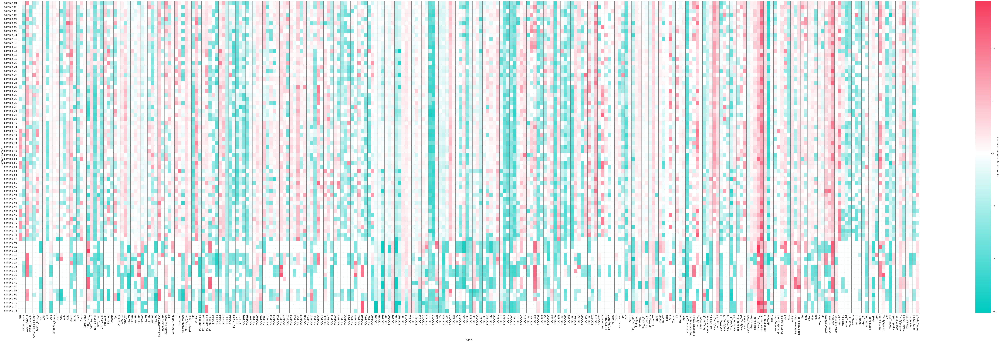

Heatmap saved successfully.


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# Load chromosome and plasmid data
chromosome_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Collect/Origin/Defense_Abundance_Sort_Sample/chromosome_to_metagenome_abundance_sorted.txt'
plasmid_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Collect/Origin/Defense_Abundance_Sort_Sample/plasmid_to_metagenome_abundance_sorted.txt'

chromosome_data = pd.read_csv(chromosome_path, sep='\t')
plasmid_data = pd.read_csv(plasmid_path, sep='\t')

# Set the index to the 'Type' column
chromosome_data.set_index('Type', inplace=True)
plasmid_data.set_index('Type', inplace=True)

# Align the datasets by their common 'Type' names
common_types = chromosome_data.index.intersection(plasmid_data.index)
chromosome_aligned = chromosome_data.loc[common_types]
plasmid_aligned = plasmid_data.loc[common_types]

# Calculate log2 fold change
fold_change = np.log2((plasmid_aligned + 1) / (chromosome_aligned + 1))

# Custom color map: Red indicates enrichment in plasmids, Green indicates enrichment in chromosomes
custom_cmap = LinearSegmentedColormap.from_list('custom', ['#00CBBF', 'white', '#F53255'])

# Plot heatmap with samples on the y-axis and types on the x-axis
# Adjust figsize for longer PDF length
plt.figure(figsize=(100, 30))  # Increase height to ensure all type names are visible
ax = sns.heatmap(fold_change.T, cmap=custom_cmap, center=0, linewidths=0.1, linecolor='gray', cbar_kws={'label': 'Log2 Fold Change (Plasmid/Chromosome)'})

plt.ylabel('Sample Names', fontsize=15)
plt.xlabel('Types', fontsize=15)
plt.xticks(rotation=90, fontsize=15)  # Rotate and adjust font size for x-axis labels
plt.yticks(fontsize=15)  # Adjust font size for y-axis labels to ensure all type names are visible

# Ensure all x-axis labels are displayed
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.tight_layout()

# Save the plot with adjusted length and high resolution
plot_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Results/01.Defense_Abundance/heatmap_fold_change_custom_colors3.pdf'
plt.savefig(plot_path, format='pdf', bbox_inches='tight', dpi=300)

plt.show()

print("Heatmap saved successfully.")


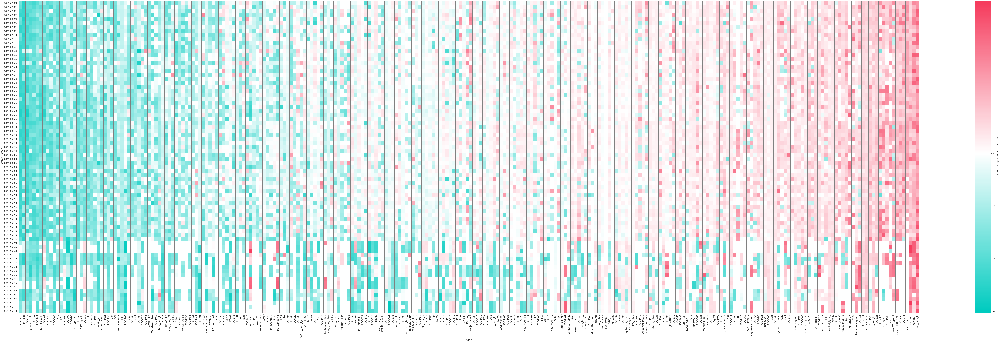

Heatmap saved successfully.


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# Load chromosome and plasmid data
chromosome_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Collect/Origin/Defense_Abundance_Sort_Sample/chromosome_to_metagenome_abundance_sorted.txt'
plasmid_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Collect/Origin/Defense_Abundance_Sort_Sample/plasmid_to_metagenome_abundance_sorted.txt'

chromosome_data = pd.read_csv(chromosome_path, sep='\t')
plasmid_data = pd.read_csv(plasmid_path, sep='\t')

# Set the index to the 'Type' column
chromosome_data.set_index('Type', inplace=True)
plasmid_data.set_index('Type', inplace=True)

# Align the datasets by their common 'Type' names
common_types = chromosome_data.index.intersection(plasmid_data.index)
chromosome_aligned = chromosome_data.loc[common_types]
plasmid_aligned = plasmid_data.loc[common_types]

# Calculate log2 fold change
fold_change = np.log2((plasmid_aligned + 1) / (chromosome_aligned + 1))

# Calculate the mean fold change for each type
mean_fold_change = fold_change.mean(axis=1)

# Sort types by the mean fold change
sorted_types = mean_fold_change.sort_values().index
fold_change = fold_change.loc[sorted_types]

# Custom color map: Red indicates enrichment in plasmids, Green indicates enrichment in chromosomes
custom_cmap = LinearSegmentedColormap.from_list('custom', ['#00CBBF', 'white', '#F53255'])

# Plot heatmap with samples on the y-axis and types on the x-axis
# Adjust figsize for longer PDF length
plt.figure(figsize=(100, 30))  # Increase height to ensure all type names are visible
ax = sns.heatmap(fold_change.T, cmap=custom_cmap, center=0, linewidths=0.1, linecolor='gray', cbar_kws={'label': 'Log2 Fold Change (Plasmid/Chromosome)'})

plt.ylabel('Sample Names', fontsize=15)
plt.xlabel('Types', fontsize=15)
plt.xticks(rotation=90, fontsize=15)  # Rotate and adjust font size for x-axis labels
plt.yticks(fontsize=15)  # Adjust font size for y-axis labels to ensure all type names are visible

# Ensure all x-axis labels are displayed
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.tight_layout()

# Save the plot with adjusted length and high resolution
plot_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Results/01.Defense_Abundance/heatmap_fold_change_custom_colors.pdf'
plt.savefig(plot_path, format='pdf', bbox_inches='tight', dpi=300)

plt.show()

print("Heatmap saved successfully.")


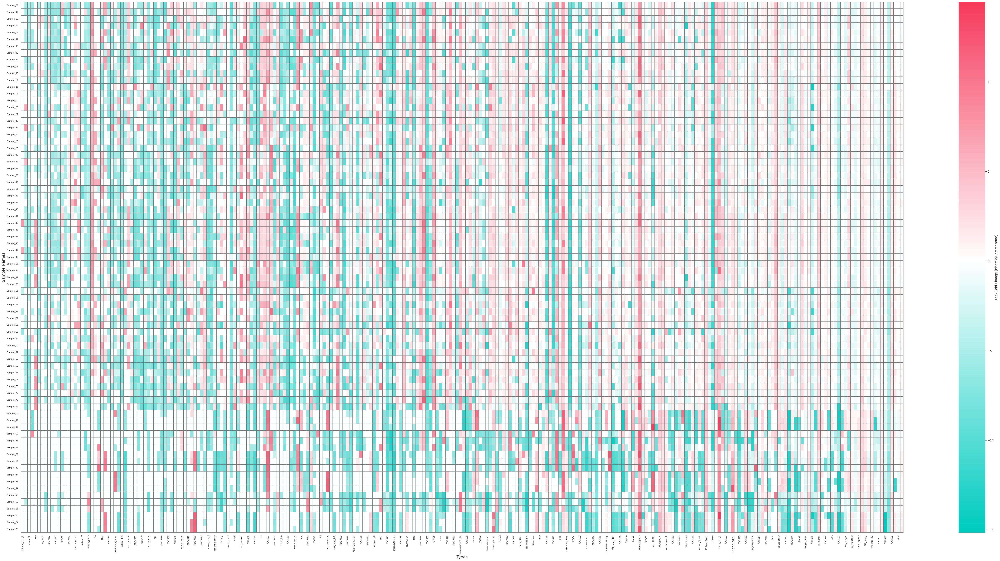

Heatmap saved successfully.


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# Load chromosome and plasmid data
chromosome_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Collect/Origin/Defense_Abundance_Sort_Sample/chromosome_to_metagenome_abundance_sorted.txt'
plasmid_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Collect/Origin/Defense_Abundance_Sort_Sample/plasmid_to_metagenome_abundance_sorted.txt'

chromosome_data = pd.read_csv(chromosome_path, sep='\t')
plasmid_data = pd.read_csv(plasmid_path, sep='\t')

# Set the index to the 'Type' column
chromosome_data.set_index('Type', inplace=True)
plasmid_data.set_index('Type', inplace=True)

# Identify types unique to chromosomes and plasmids, and those common to both
unique_chromosome_types = chromosome_data.index.difference(plasmid_data.index)
unique_plasmid_types = plasmid_data.index.difference(chromosome_data.index)
common_types = chromosome_data.index.intersection(plasmid_data.index)

# Sort the types within each category by their mean abundance
chromosome_sorted = chromosome_data.loc[unique_chromosome_types].mean(axis=1).sort_values().index
plasmid_sorted = plasmid_data.loc[unique_plasmid_types].mean(axis=1).sort_values().index
common_sorted = (chromosome_data.loc[common_types] + plasmid_data.loc[common_types]).mean(axis=1).sort_values().index

# Concatenate the sorted indices
sorted_types = chromosome_sorted.append(common_sorted).append(plasmid_sorted)

# Check and align the data
sorted_types = sorted_types.intersection(chromosome_data.index).intersection(plasmid_data.index)
chromosome_aligned = chromosome_data.loc[sorted_types]
plasmid_aligned = plasmid_data.loc[sorted_types]

# Calculate log2 fold change
fold_change = np.log2((plasmid_aligned + 1) / (chromosome_aligned + 1))

# Custom color map: Red indicates enrichment in plasmids, Green indicates enrichment in chromosomes
custom_cmap = LinearSegmentedColormap.from_list('custom', ['#00CBBF', 'white', '#F53255'])

# Plot heatmap with samples on the y-axis and types on the x-axis
# Adjust figsize for longer PDF length
plt.figure(figsize=(60, 30))  # Increase width to ensure all type names are visible
ax = sns.heatmap(fold_change.T, cmap=custom_cmap, center=0, linewidths=0.1, linecolor='gray', cbar_kws={'label': 'Log2 Fold Change (Plasmid/Chromosome)'})

plt.ylabel('Sample Names', fontsize=15)
plt.xlabel('Types', fontsize=15)
plt.xticks(rotation=90, fontsize=8)  # Rotate and adjust font size for x-axis labels
plt.yticks(fontsize=8)  # Adjust font size for y-axis labels to ensure all sample names are visible

# Ensure all x-axis labels are displayed
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.tight_layout()

# Save the plot with adjusted length and high resolution
plot_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Results/01.Defense_Abundance/heatmap_fold_change_custom_colors2.pdf'
plt.savefig(plot_path, format='pdf', bbox_inches='tight', dpi=300)

plt.show()

print("Heatmap saved successfully.")


## Taxonomy

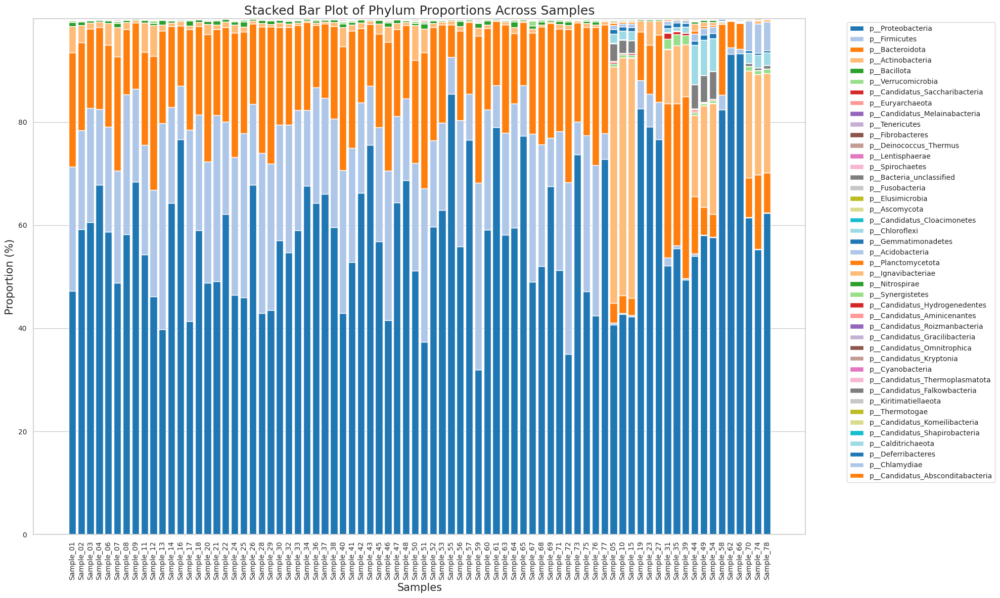

Stacked bar plot generated and saved successfully.


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os

# Load the data
file_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Collect/Metaphlan_P_sorted.txt'
data = pd.read_csv(file_path, sep='\t')

# Set the index to the 'Phylum' column
data.set_index('Phylum', inplace=True)

# Define the custom order of phyla
custom_order = [
    "p__Proteobacteria", "p__Firmicutes", "p__Bacteroidota", "p__Actinobacteria", "p__Bacillota",
    "p__Verrucomicrobia", "p__Candidatus_Saccharibacteria", "p__Euryarchaeota", "p__Candidatus_Melainabacteria",
    "p__Tenericutes", "p__Fibrobacteres", "p__Deinococcus_Thermus", "p__Lentisphaerae", "p__Spirochaetes",
    "p__Bacteria_unclassified", "p__Fusobacteria", "p__Elusimicrobia", "p__Ascomycota", "p__Candidatus_Cloacimonetes",
    "p__Chloroflexi", "p__Gemmatimonadetes", "p__Acidobacteria", "p__Planctomycetota", "p__Ignavibacteriae",
    "p__Nitrospirae", "p__Synergistetes", "p__Candidatus_Hydrogenedentes", "p__Candidatus_Aminicenantes",
    "p__Candidatus_Roizmanbacteria", "p__Candidatus_Gracilibacteria", "p__Candidatus_Omnitrophica",
    "p__Candidatus_Kryptonia", "p__Cyanobacteria", "p__Candidatus_Thermoplasmatota", "p__Candidatus_Falkowbacteria",
    "p__Kiritimatiellaeota", "p__Thermotogae", "p__Candidatus_Komeilibacteria", "p__Candidatus_Shapirobacteria",
    "p__Calditrichaeota", "p__Deferribacteres", "p__Chlamydiae", "p__Candidatus_Absconditabacteria"
]

# Filter and reindex data based on custom order
data = data.loc[custom_order]

# Define the color palette
colors = plt.cm.tab20.colors

# Plotting the stacked bar chart
plt.figure(figsize=(20, 12))

# Plot each phylum as a segment in the bar
bottom = np.zeros(len(data.columns))
for idx, phylum in enumerate(data.index):
    plt.bar(data.columns, data.loc[phylum], bottom=bottom, color=colors[idx % len(colors)], label=phylum)
    bottom += data.loc[phylum]

plt.xlabel('Samples', fontsize=15)
plt.ylabel('Proportion (%)', fontsize=15)
plt.title('Stacked Bar Plot of Phylum Proportions Across Samples', fontsize=18)
plt.xticks(rotation=90, fontsize=10)
plt.yticks(fontsize=10)
plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1), fontsize=10)
plt.tight_layout()

# Save the plot
plot_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Results/stacked_bar_plot_all_samples.pdf'
plt.savefig(plot_path, format='pdf', bbox_inches='tight', dpi=300)
plt.show()

print("Stacked bar plot generated and saved successfully.")


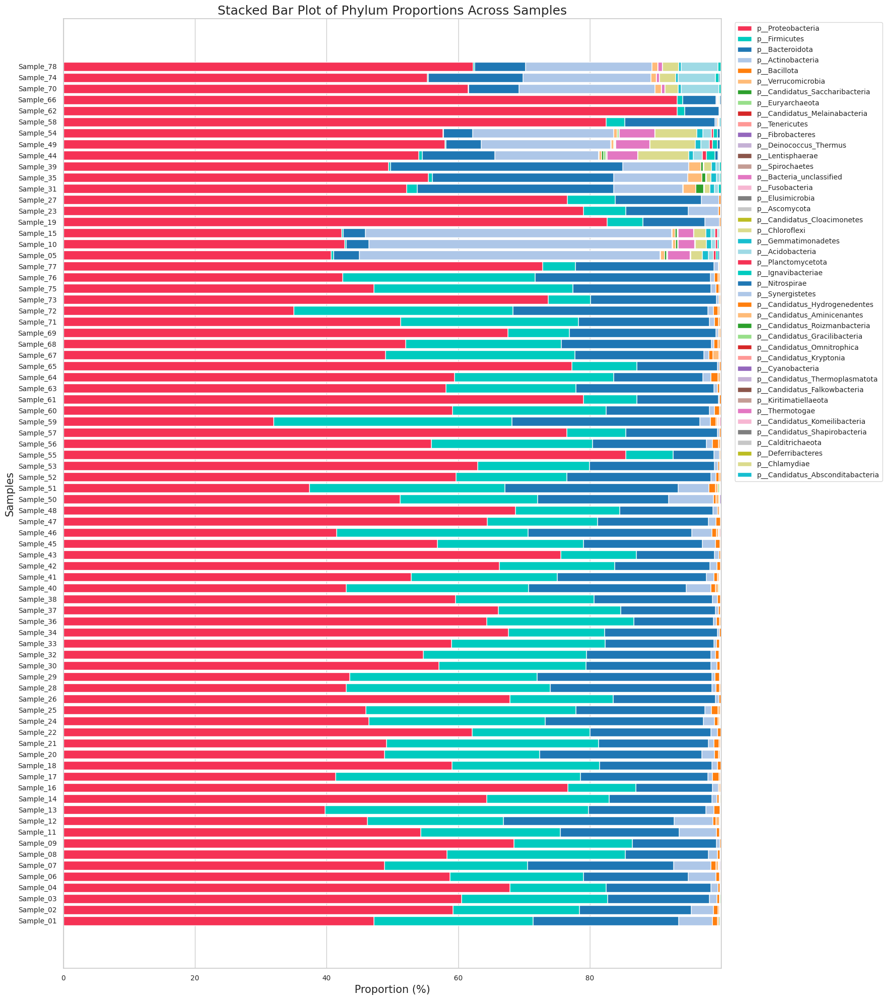

Stacked bar plot generated and saved successfully.


In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# Define directory paths
directory_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Collect/'
save_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Results/'

# Load the data
file_path = os.path.join(directory_path, 'Metaphlan_P_sorted.txt')
data = pd.read_csv(file_path, sep='\t')

# Set the index to the 'Phylum' column
data.set_index('Phylum', inplace=True)

# Define the custom order of phyla
custom_order = [
    "p__Proteobacteria", "p__Firmicutes", "p__Bacteroidota", "p__Actinobacteria", "p__Bacillota",
    "p__Verrucomicrobia", "p__Candidatus_Saccharibacteria", "p__Euryarchaeota", "p__Candidatus_Melainabacteria",
    "p__Tenericutes", "p__Fibrobacteres", "p__Deinococcus_Thermus", "p__Lentisphaerae", "p__Spirochaetes",
    "p__Bacteria_unclassified", "p__Fusobacteria", "p__Elusimicrobia", "p__Ascomycota", "p__Candidatus_Cloacimonetes",
    "p__Chloroflexi", "p__Gemmatimonadetes", "p__Acidobacteria", "p__Planctomycetota", "p__Ignavibacteriae",
    "p__Nitrospirae", "p__Synergistetes", "p__Candidatus_Hydrogenedentes", "p__Candidatus_Aminicenantes",
    "p__Candidatus_Roizmanbacteria", "p__Candidatus_Gracilibacteria", "p__Candidatus_Omnitrophica",
    "p__Candidatus_Kryptonia", "p__Cyanobacteria", "p__Candidatus_Thermoplasmatota", "p__Candidatus_Falkowbacteria",
    "p__Kiritimatiellaeota", "p__Thermotogae", "p__Candidatus_Komeilibacteria", "p__Candidatus_Shapirobacteria",
    "p__Calditrichaeota", "p__Deferribacteres", "p__Chlamydiae", "p__Candidatus_Absconditabacteria"
]

# Filter and reindex data based on custom order
data = data.loc[custom_order]

# Define the color palette with primary colors
custom_colors = ['#F53255', '#00CBBF'] + list(plt.cm.tab20.colors)

# Plotting the stacked bar chart
plt.figure(figsize=(18, 20))

# Plot each phylum as a segment in the bar
bottom = np.zeros(len(data.columns))
for idx, phylum in enumerate(data.index):
    plt.barh(data.columns, data.loc[phylum], left=bottom, color=custom_colors[idx % len(custom_colors)], label=phylum)
    bottom += data.loc[phylum]

plt.ylabel('Samples', fontsize=15)
plt.xlabel('Proportion (%)', fontsize=15)
plt.title('Stacked Bar Plot of Phylum Proportions Across Samples', fontsize=18)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1), fontsize=10)
plt.tight_layout()

# Save the plot
plot_path = os.path.join(save_path, 'stacked_bar_plot_all_samples_custom_colors.pdf')
plt.savefig(plot_path, format='pdf', bbox_inches='tight', dpi=300)
plt.show()

print("Stacked bar plot generated and saved successfully.")


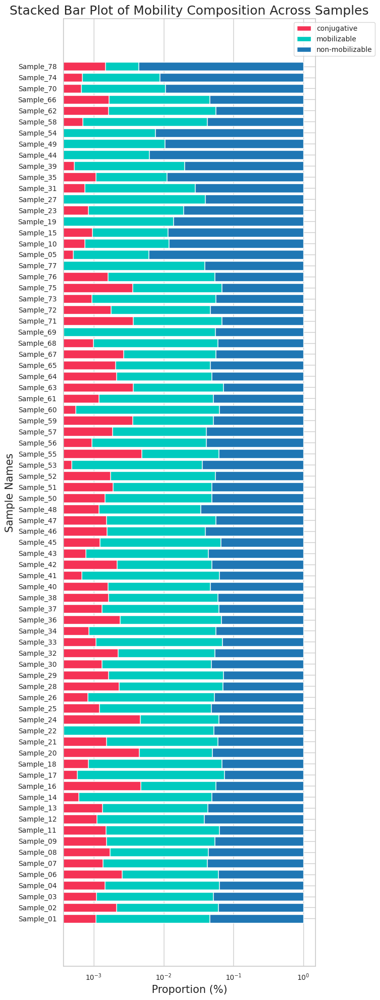

Stacked bar plot generated and saved successfully at /content/drive/My Drive/Projects/GENIUS_Repository/Results/Mob_type.pdf


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Define the file path
file_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Collect/Mob_info_sorted.txt'

# Load the data
data = pd.read_csv(file_path, sep='\t')

# Pivot the data to get the proportions of Mobility types per Sample_Name
mobility_data = data.groupby(['Sample_Name', 'Mobility']).size().unstack(fill_value=0)

# Normalize the data to get proportions
mobility_data = mobility_data.div(mobility_data.sum(axis=1), axis=0)

# Define the custom order for Sample_Name
custom_order = [
    "Sample_01", "Sample_02", "Sample_03", "Sample_04", "Sample_06", "Sample_07", "Sample_08", "Sample_09",
    "Sample_11", "Sample_12", "Sample_13", "Sample_14", "Sample_16", "Sample_17", "Sample_18", "Sample_20",
    "Sample_21", "Sample_22", "Sample_24", "Sample_25", "Sample_26", "Sample_28", "Sample_29", "Sample_30",
    "Sample_32", "Sample_33", "Sample_34", "Sample_36", "Sample_37", "Sample_38", "Sample_40", "Sample_41",
    "Sample_42", "Sample_43", "Sample_45", "Sample_46", "Sample_47", "Sample_48", "Sample_50", "Sample_51",
    "Sample_52", "Sample_53", "Sample_55", "Sample_56", "Sample_57", "Sample_59", "Sample_60", "Sample_61",
    "Sample_63", "Sample_64", "Sample_65", "Sample_67", "Sample_68", "Sample_69", "Sample_71", "Sample_72",
    "Sample_73", "Sample_75", "Sample_76", "Sample_77", "Sample_05", "Sample_10", "Sample_15", "Sample_19",
    "Sample_23", "Sample_27", "Sample_31", "Sample_35", "Sample_39", "Sample_44", "Sample_49", "Sample_54",
    "Sample_58", "Sample_62", "Sample_66", "Sample_70", "Sample_74", "Sample_78"
]

# Reindex the data to follow the custom order
mobility_data = mobility_data.reindex(custom_order)

# Define the color palette
custom_colors = ['#F53255', '#00CBBF'] + list(plt.cm.tab20.colors)

# Create a color dictionary for Mobility types
color_dict = {mobility_type: custom_colors[idx % len(custom_colors)] for idx, mobility_type in enumerate(mobility_data.columns)}

# Plotting the stacked bar chart
plt.figure(figsize=(8, 20))

# Plot each Mobility type as a segment in the bar
bottom = np.zeros(len(mobility_data.index))
for mobility_type in mobility_data.columns:
    plt.barh(mobility_data.index, mobility_data[mobility_type], left=bottom, color=color_dict[mobility_type], label=mobility_type)
    bottom += mobility_data[mobility_type]

plt.xlabel('Proportion (%)', fontsize=15)
plt.ylabel('Sample Names', fontsize=15)
plt.title('Stacked Bar Plot of Mobility Composition Across Samples', fontsize=18)
plt.xscale('log')  # Use logarithmic scale for x-axis to expand smaller proportions
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1), fontsize=10)
plt.tight_layout()

# Save the plot
plot_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Results/Mob_type.pdf'
plt.savefig(plot_path, format='pdf', bbox_inches='tight', dpi=300)
plt.show()



print(f"Stacked bar plot generated and saved successfully at {plot_path}")


##Pie Plot

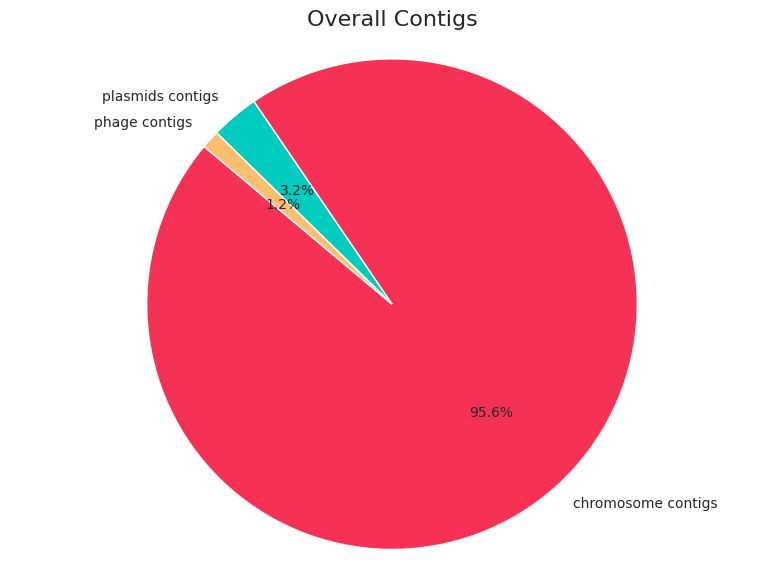

Pie chart 1 generated and saved successfully at /content/drive/My Drive/Projects/GENIUS_Repository/Results/pie_chart_1.pdf


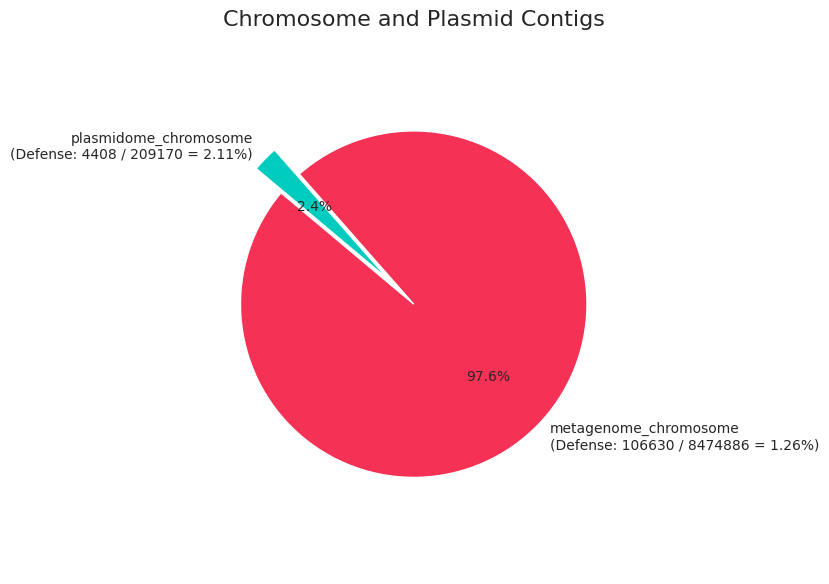

Pie chart 2 generated and saved successfully at /content/drive/My Drive/Projects/GENIUS_Repository/Results/pie_chart_2.pdf


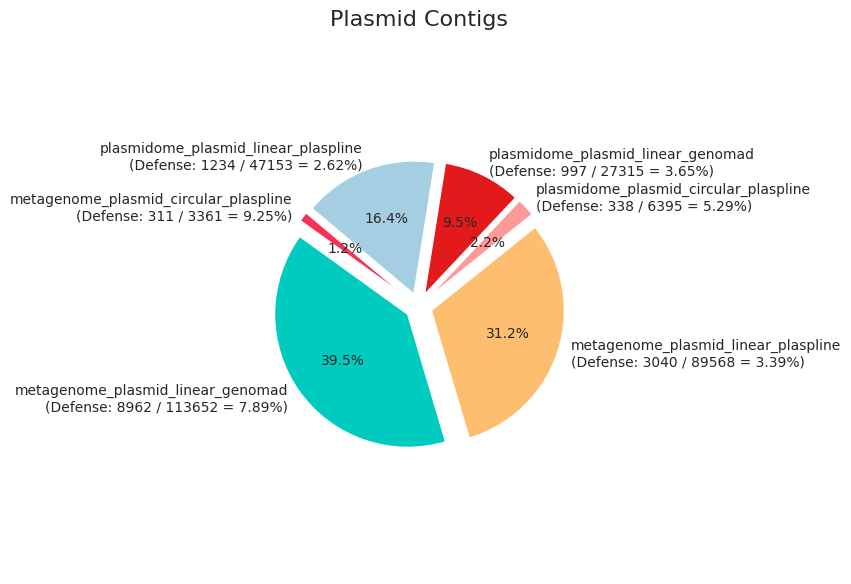

Pie chart 3 generated and saved successfully at /content/drive/My Drive/Projects/GENIUS_Repository/Results/pie_chart_3.pdf


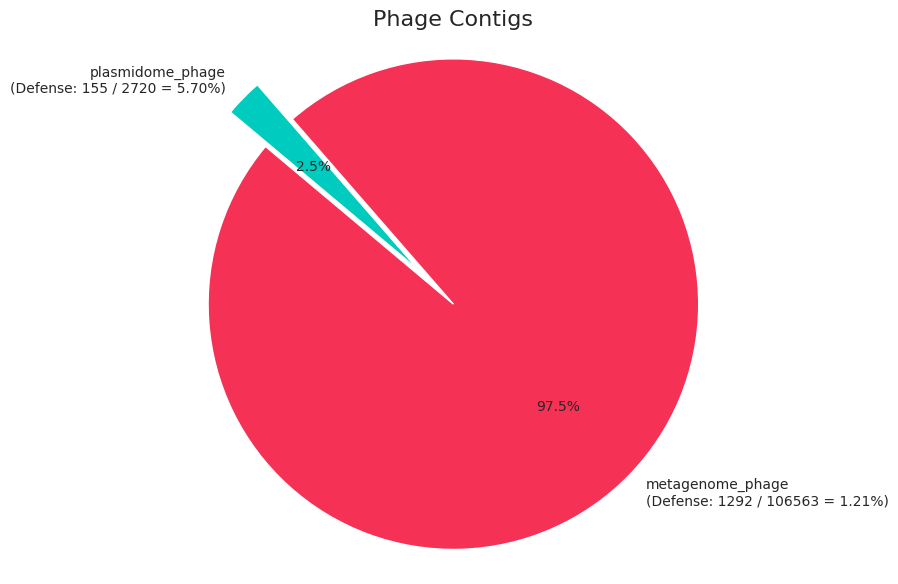

Pie chart 4 generated and saved successfully at /content/drive/My Drive/Projects/GENIUS_Repository/Results/pie_chart_4.pdf


In [ ]:
import matplotlib.pyplot as plt

# Data for the four pie charts
data = [
    {
        'title': 'Overall Contigs',
        'labels': ['chromosome contigs', 'plasmids contigs', 'phage contigs'],
        'sizes': [8684056, 287444, 109283],
        'colors': ['#F53255', '#00CBBF', '#FDBF6F'],
        'defense': [None, None, None]
    },
    {
        'title': 'Chromosome and Plasmid Contigs',
        'labels': ['metagenome_chromosome', 'plasmidome_chromosome'],
        'sizes': [8474886, 209170],
        'defense': [106630, 4408],
        'colors': ['#F53255', '#00CBBF']
    },
    {
        'title': 'Plasmid Contigs',
        'labels': [
            'metagenome_plasmid_circular_plaspline', 'metagenome_plasmid_linear_genomad', 'metagenome_plasmid_linear_plaspline',
            'plasmidome_plasmid_circular_plaspline', 'plasmidome_plasmid_linear_genomad', 'plasmidome_plasmid_linear_plaspline'
        ],
        'sizes': [3361, 113652, 89568, 6395, 27315, 47153],
        'defense': [311, 8962, 3040, 338, 997, 1234],
        'colors': ['#F53255', '#00CBBF', '#FDBF6F', '#FB9A99', '#E31A1C', '#A6CEE3']
    },
    {
        'title': 'Phage Contigs',
        'labels': ['metagenome_phage', 'plasmidome_phage'],
        'sizes': [106563, 2720],
        'defense': [1292, 155],
        'colors': ['#F53255', '#00CBBF']
    }
]

# Function to create a pie chart
def create_pie_chart(data, idx):
    plt.figure(figsize=(8, 6))

    labels = []
    sizes = data['sizes']
    explode = [0] * len(sizes)

    for i, (label, size, defense) in enumerate(zip(data['labels'], sizes, data['defense'])):
        if defense:
            proportion = defense / size * 100
            labels.append(f'{label}\n(Defense: {defense} / {size} = {proportion:.2f}%)')
            explode[i] = 0.1  # Only explode the slice for defense systems
        else:
            labels.append(label)

    wedges, texts, autotexts = plt.pie(
        sizes, labels=labels, colors=data['colors'], autopct='%1.1f%%', startangle=140, explode=explode
    )

    for text in texts + autotexts:
        text.set_fontsize(10)

    plt.title(data['title'], fontsize=16)
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    plt.tight_layout()

    # Save the plot
    plot_path = f'/content/drive/My Drive/Projects/GENIUS_Repository/Results/pie_chart_{idx + 1}.pdf'
    plt.savefig(plot_path, format='pdf', bbox_inches='tight', dpi=300)
    plt.show()
    print(f"Pie chart {idx + 1} generated and saved successfully at {plot_path}")

# Generate pie charts
for idx, chart_data in enumerate(data):
    create_pie_chart(chart_data, idx)


In [ ]:
import pandas as pd

# Define the file path
file_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Collect/Mob_info_sorted.txt'

# Load the data
data = pd.read_csv(file_path, sep='\t')

# Aggregate the data by Sample_Name and Mobility
agg_data = data.groupby(['Sample_Name', 'Mobility']).size().unstack(fill_value=0)

# Calculate the proportions for each Mobility category
agg_data = agg_data.div(agg_data.sum(axis=1), axis=0)

# Reset the index to make Sample_Name a column again
agg_data.reset_index(inplace=True)

# Save the processed data to a new TXT file
output_file_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Collect/processed_mobility_data.txt'
agg_data.to_csv(output_file_path, sep='\t', index=False)

print(f"Processed data saved to {output_file_path}")

# Display the processed data
agg_data.head()


Processed data saved to /content/drive/My Drive/Projects/GENIUS_Repository/Collect/processed_mobility_data.txt


Mobility,Sample_Name,conjugative,mobilizable,non-mobilizable
0,Sample_01,0.001070,0.044664,0.954266
1,Sample_02,0.002100,0.057758,0.940142
2,Sample_03,0.001081,0.049957,0.948962
3,Sample_04,0.001446,0.061289,0.937265
4,Sample_05,0.000506,0.005561,0.993933


In [ ]:
import pandas as pd

# Define the file path
file_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Collect/Metaphlan_P_sorted.txt'

# Load the data
data = pd.read_csv(file_path, sep='\t')

# Transpose the data
transposed_data = data.set_index('Phylum').transpose().reset_index()

# Rename the 'index' column to 'Sample_Name'
transposed_data.rename(columns={'index': 'Sample_Name'}, inplace=True)

# Save the processed data to a new TXT file
output_file_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Collect/processed_metaphlan_data.txt'
transposed_data.to_csv(output_file_path, sep='\t', index=False)

print(f"Processed data saved to {output_file_path}")

# Display the processed data
transposed_data.head()


Processed data saved to /content/drive/My Drive/Projects/GENIUS_Repository/Collect/processed_metaphlan_data.txt


Phylum,Sample_Name,p__Proteobacteria,p__Firmicutes,p__Bacteroidota,p__Actinobacteria,p__Bacillota,p__Verrucomicrobia,p__Candidatus_Saccharibacteria,p__Euryarchaeota,p__Candidatus_Melainabacteria,...,p__Candidatus_Thermoplasmatota,p__Candidatus_Falkowbacteria,p__Kiritimatiellaeota,p__Thermotogae,p__Candidatus_Komeilibacteria,p__Candidatus_Shapirobacteria,p__Calditrichaeota,p__Deferribacteres,p__Chlamydiae,p__Candidatus_Absconditabacteria
0,Sample_01,47.19997,24.17238,22.11173,5.11814,0.73556,0.26448,0.14073,0.09450,0.04816,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Sample_02,59.18340,19.25170,16.94907,3.40180,0.65642,0.20059,0.02615,0.10791,0.06455,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Sample_03,60.51600,22.18237,15.41179,1.18409,0.35455,0.12197,0.01935,0.11162,0.01625,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Sample_04,67.80637,14.65115,15.91134,1.11093,0.28303,0.06803,0.04825,0.01970,0.01546,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Sample_06,58.70041,20.33320,15.92377,4.18129,0.51352,0.16731,0.02120,0.02545,0.02862,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
import pandas as pd

# Define the file path
file_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Collect/Origin/Defense_Abundance/plasmid_to_metagenome_abundance_merged.txt'

# Load the data
data = pd.read_csv(file_path, sep='\t')

# Transpose the data
transposed_data = data.set_index('Type').transpose().reset_index()

# Rename the 'index' column to 'Sample_Name'
transposed_data.rename(columns={'index': 'Sample_Name'}, inplace=True)

# Save the processed data to a new TXT file
output_file_path = '/content/drive/My Drive/Projects/GENIUS_Repository/Collect/processed_padloc_data.txt'
transposed_data.to_csv(output_file_path, sep='\t', index=False)

print(f"Processed data saved to {output_file_path}")

# Display the processed data
transposed_data.head()

Processed data saved to /content/drive/My Drive/Projects/GENIUS_Repository/Collect/processed_padloc_data.txt


Type,Sample_Name,3HP,AVAST_type_II,AVAST_type_III,AVAST_type_IV,AVAST_type_I_other,AVAST_type_V,AbiD,AbiE,AbiJ,...,tmn,viperin_solo,viperin_toxin,wadjet_other,wadjet_type_I,wadjet_type_II,zorya_other,zorya_type_I,zorya_type_II,zorya_type_III
0,Sample_01,0.0,120.956006,291.174370,48.499052,0.0,0.0,9862.069232,54919.54581,0.0,...,0.00000,778.156418,0.000000,11113.569390,3205.300819,754.507270,3430.820255,170.087236,0.00000,2985.501424
1,Sample_02,0.0,39.842520,56.426416,0.000000,0.0,0.0,5052.975715,63817.34953,0.0,...,0.00000,466.344732,0.000000,9032.705882,2426.068809,500.678250,2620.582961,183.646070,0.00000,1502.130700
2,Sample_03,0.0,55.704331,121.873805,0.000000,0.0,0.0,8645.674603,48729.02053,0.0,...,911.90848,282.936923,161.252765,6642.422008,1556.643392,311.833092,6018.230774,209.433089,228.37244,5989.499374
3,Sample_04,0.0,0.000000,67.533038,0.000000,0.0,0.0,6594.472744,39758.37319,0.0,...,1032.09084,0.000000,99.560393,5639.652582,1251.759385,154.319850,4907.227682,144.732120,0.00000,5229.093899
4,Sample_05,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,56767.07051,0.0,...,0.00000,0.000000,0.000000,4442.297200,11774.231700,6159.630200,11412.533250,0.000000,0.00000,5422.560530


                                  conjugative  mobilizable  non-mobilizable
p__Proteobacteria                   -0.090281     0.006172        -0.000600
p__Firmicutes                        0.369466     0.671567        -0.675975
p__Bacteroidota                      0.168041     0.358021        -0.358638
p__Actinobacteria                   -0.275303    -0.716590         0.714168
p__Bacillota                         0.238634     0.536963        -0.537085
p__Verrucomicrobia                  -0.129880    -0.501730         0.496266
p__Candidatus_Saccharibacteria      -0.164892    -0.395053         0.394504
p__Euryarchaeota                    -0.246246    -0.400492         0.404674
p__Candidatus_Melainabacteria        0.344236     0.319682        -0.331868
p__Tenericutes                       0.118548     0.075146        -0.080265
p__Fibrobacteres                     0.000790     0.030697        -0.029933
p__Deinococcus_Thermus               0.331408     0.095589        -0.112923
p__Lentispha

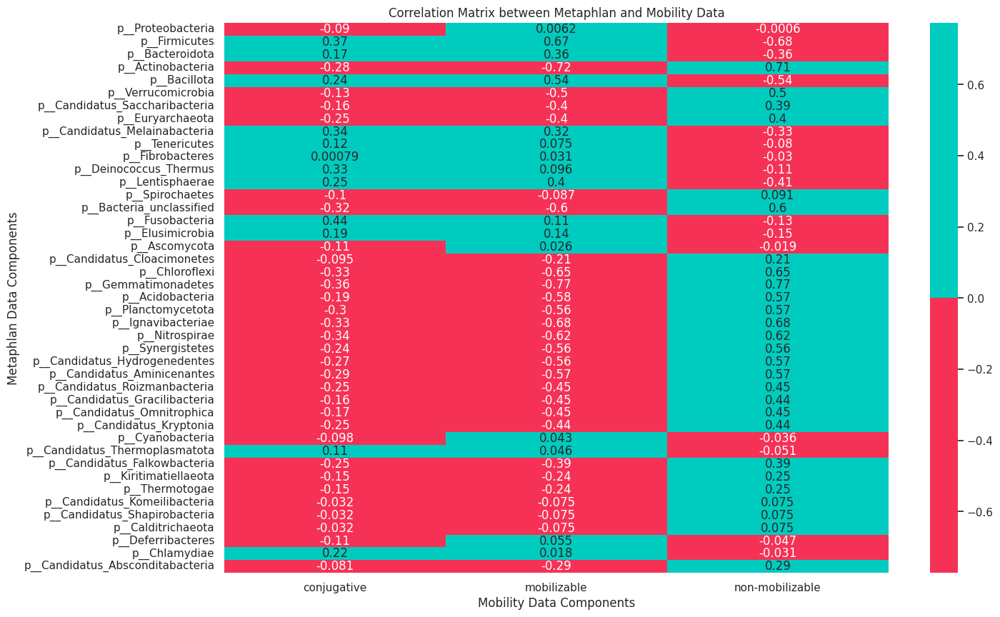

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# 读取数据
mobility_data = pd.read_csv('/content/drive/My Drive/Projects/GENIUS_Repository/Collect/Compute_cor/processed_mobility_data_sorted.txt', sep='\t', index_col=0)
metaphlan_data = pd.read_csv('/content/drive/My Drive/Projects/GENIUS_Repository/Collect/Compute_cor/processed_metaphlan_data.txt', sep='\t', index_col=0)

# 确保样本顺序一致
mobility_data = mobility_data.sort_index()
metaphlan_data = metaphlan_data.sort_index()

# 计算相关系数矩阵
correlation_matrix = pd.DataFrame(index=metaphlan_data.columns, columns=mobility_data.columns)  # 交换行列

for metaphlan_component in metaphlan_data.columns:
    for mobility_component in mobility_data.columns:
        correlation_matrix.loc[metaphlan_component, mobility_component] = np.corrcoef(metaphlan_data[metaphlan_component], mobility_data[mobility_component])[0, 1]

# 将相关系数矩阵转为数值类型
correlation_matrix = correlation_matrix.astype(float)

# 打印相关系数矩阵
print(correlation_matrix)

# 可视化相关系数矩阵
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, cmap=sns.color_palette(["#F53255", "#00CBBF"]), center=0)
plt.title('Correlation Matrix between Metaphlan and Mobility Data')
plt.xlabel('Mobility Data Components')
plt.ylabel('Metaphlan Data Components')

# 保存图片为PDF
plt.savefig('/content/drive/My Drive/Projects/GENIUS_Repository/Results/correlation_matrix.pdf', format='pdf')

# 显示图像
plt.show()


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


                                       3HP  AVAST_type_II  AVAST_type_III  \
p__Proteobacteria                -0.023365      -0.402087       -0.098745   
p__Firmicutes                     0.071628       0.507228        0.353942   
p__Bacteroidota                   0.274346       0.368654        0.176621   
p__Actinobacteria                -0.175237      -0.205582       -0.286629   
p__Bacillota                      0.062837       0.438420        0.231594   
p__Verrucomicrobia               -0.088984      -0.079841       -0.079325   
p__Candidatus_Saccharibacteria   -0.117104      -0.142814       -0.132587   
p__Euryarchaeota                 -0.035460      -0.068126       -0.238563   
p__Candidatus_Melainabacteria     0.074858       0.396091        0.235328   
p__Tenericutes                   -0.141184       0.062077       -0.267286   
p__Fibrobacteres                 -0.043626      -0.034647       -0.177351   
p__Deinococcus_Thermus           -0.088132      -0.004604       -0.106300   

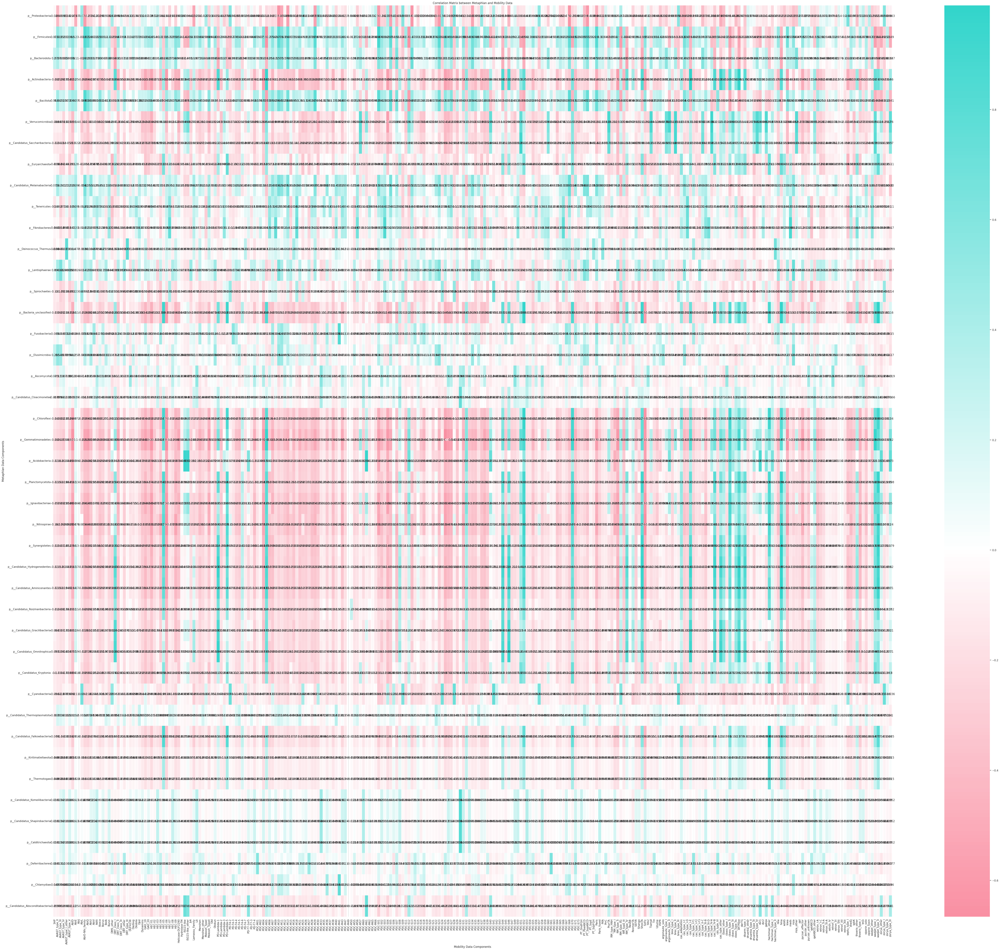

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# 读取数据
mobility_data = pd.read_csv('/content/drive/My Drive/Projects/GENIUS_Repository/Collect/Compute_cor/processed_padloc_data_sorted.txt', sep='\t', index_col=0)
metaphlan_data = pd.read_csv('/content/drive/My Drive/Projects/GENIUS_Repository/Collect/Compute_cor/processed_metaphlan_data.txt', sep='\t', index_col=0)

# 确保样本顺序一致
mobility_data = mobility_data.sort_index()
metaphlan_data = metaphlan_data.sort_index()

# 计算相关系数矩阵
correlation_matrix = pd.DataFrame(index=metaphlan_data.columns, columns=mobility_data.columns)  # 交换行列

for metaphlan_component in metaphlan_data.columns:
    for mobility_component in mobility_data.columns:
        correlation_matrix.loc[metaphlan_component, mobility_component] = np.corrcoef(metaphlan_data[metaphlan_component], mobility_data[mobility_component])[0, 1]

# 将相关系数矩阵转为数值类型
correlation_matrix = correlation_matrix.astype(float)

# 打印相关系数矩阵
print(correlation_matrix)

# 自定义颜色调色板
cmap = LinearSegmentedColormap.from_list('custom', ['#F53255', '#ffffff', '#00CBBF'], N=256)

# 可视化相关系数矩阵
plt.figure(figsize=(80, 70))
sns.heatmap(correlation_matrix, annot=True, cmap=cmap, center=0, alpha=0.8)
plt.title('Correlation Matrix between Metaphlan and Mobility Data')
plt.xlabel('Mobility Data Components')
plt.ylabel('Metaphlan Data Components')

# 保存图片为PDF
plt.savefig('/content/drive/My Drive/Projects/GENIUS_Repository/Results/correlation_matrix2.pdf', format='pdf')


# 显示图像
plt.show()
